In [1]:
import os
os.environ['CUDA_VISIBLE_DEVICES']='1'

from fastai import *
from fastai.vision import *
from ArNet.generators import *
from ArNet.critics import *
from ArNet.dataset import *
from ArNet.loss import *
from ArNet.save import *
from ArNet.fid_loss import *
from ArNet.ssim import *
from ArNet.metrics import *

import torchvision
import geffnet # efficient/ mobile net

In [2]:
def do_fit(learn, epochs,save_name, lrs=slice(1e-3), pct_start=0.3):
    learn.fit_one_cycle(epochs, lrs, pct_start=pct_start)
    learn.save("/data/students_home/fmameli/repos/Artifact_Removal_GAN/models/" + save_name)
    learn.show_results(rows=1, imgsize=10)

In [3]:
path = Path('./dataset/')

path_fullRes = path/'DIV2K_train_HR'

path_lowRes_512 = path/'DIV2K_train_LR_512_QF20'

proj_id = 'unet_superRes_mobilenetV3_LPIPS_Tuned'

gen_name = proj_id + '_gen'
crit_name = proj_id + '_crit'

nf_factor = 2
pct_start = 1e-8

# Fine tune mobileNetV3

In [4]:
model = geffnet.mobilenetv3_rw

In [5]:
loss_func = lpips_loss()

Setting up Perceptual loss...
Loading model from: /data/students_home/fmameli/anaconda3/envs/fastai/lib/python3.6/site-packages/perceptual_similarity/weights/v0.1/alex.pth
...[net-lin [alex]] initialized
...Done


In [6]:
bs=2
sz=512
lr = 1e-2
wd = 1e-3
epochs = 1

In [7]:
data_gen = get_DIV2k_data_QF(path_lowRes_512, path_fullRes, bs=bs, sz=sz)

In [8]:
learn_gen = gen_learner_wide(data=data_gen,
                             gen_loss=loss_func,
                             arch = model,
                             nf_factor=nf_factor)

In [9]:
learn_gen.metrics.append(SSIM_Metric_gen())
learn_gen.metrics.append(SSIM_Metric_input())
learn_gen.metrics.append(BRISQUE_Metric_gen())
learn_gen.metrics.append(BRISQUE_Metric_input())
learn_gen.metrics.append(BRISQUE_Metric_target())
learn_gen.metrics.append(NIQE_Metric_gen())
learn_gen.metrics.append(NIQE_Metric_input())
learn_gen.metrics.append(NIQE_Metric_target())

# CLR

In [13]:
from ArNet.clr_scheduler import *

In [16]:
clr = CircularLRScheduler(learn_gen, mode='triangular2', 
                                      base_lr=1e-4, max_lr=1e-2, step_size=100)
learn_gen.fit(3, callbacks=[clr])

epoch,train_loss,valid_loss,ssim_gen,ssim_in,brisque_gen,brisque_in,brisque_tar,niqe_gen,niqe_in,niqe_tar,time
0,0.332714,0.288981,0.679423,0.707517,83.808064,87.354943,85.322157,16.924150,17.860744,15.693551,07:56
1,0.294496,0.271378,0.678846,0.707517,84.797948,87.354943,85.322157,16.796562,17.860744,15.693551,08:25
2,0.297613,0.265061,0.697069,0.707517,86.372489,87.354943,85.322157,17.030170,17.860744,15.693551,08:02


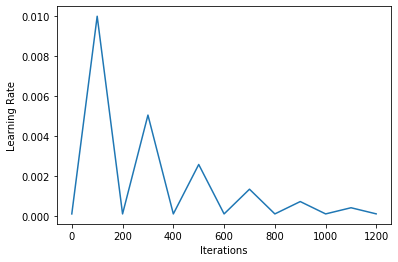

In [17]:
learn_gen.recorder.plot_lr()

In [10]:
learn_gen.load("/data/students_home/fmameli/repos/Artifact_Removal_GAN/models/unet_wideNf2_superRes_mobilenetV3_Patches64px_gen_64px_0")

Learner(data=ImageDataBunch;

Train: LabelList (800 items)
x: ImageImageList
Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512)
y: ImageList
Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512)
Path: dataset/DIV2K_train_LR_512_QF20;

Valid: LabelList (100 items)
x: ImageImageList
Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512)
y: ImageList
Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512)
Path: dataset/DIV2K_train_LR_512_QF20;

Test: None, model=DynamicUnetWide(
  (layers): ModuleList(
    (0): Sequential(
      (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(16, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
      (2): HardSwish()
      (3): Sequential(
        (0): Sequential(
          (0): DepthwiseSeparableConv(
 

# One Cycle

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


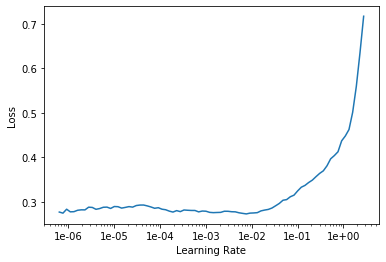

In [11]:
learn_gen.lr_find()
learn_gen.recorder.plot()

epoch,train_loss,valid_loss,ssim_gen,ssim_in,brisque_gen,brisque_in,brisque_tar,niqe_gen,niqe_in,niqe_tar,time
0,0.303339,0.319311,0.677455,0.707517,84.538355,87.354943,85.322157,16.407461,17.860744,15.693551,08:45
1,0.329547,0.357695,0.640317,0.707517,80.916053,87.354943,85.322157,16.744539,17.860744,15.693551,08:16
2,0.325673,0.487136,0.609053,0.707517,84.424909,87.354943,85.322157,16.642359,17.860744,15.693551,07:47
3,0.323019,0.301831,0.698085,0.707517,86.154625,87.354943,85.322157,17.118057,17.860744,15.693551,07:21
4,0.288103,0.293080,0.685056,0.707517,85.242947,87.354943,85.322157,16.860210,17.860744,15.693551,08:04


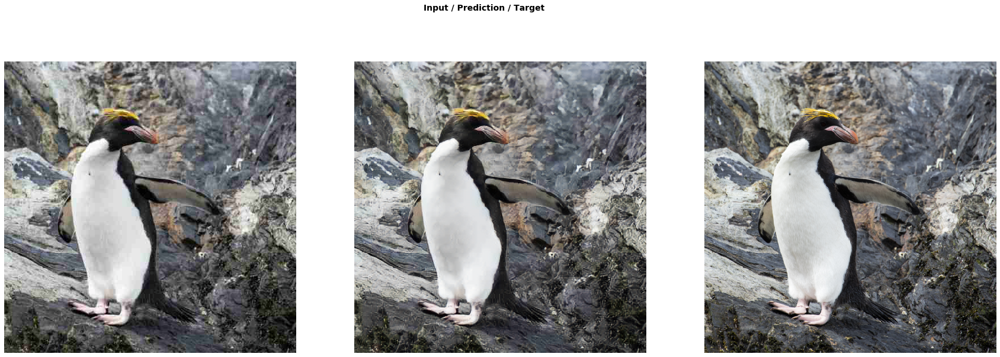

In [12]:
do_fit(learn_gen, 5, gen_name+"_512px_0", slice(1e-2), pct_start=0.8)

epoch,train_loss,valid_loss,ssim_gen,ssim_in,brisque_gen,brisque_in,brisque_tar,niqe_gen,niqe_in,niqe_tar,time
0,0.283999,0.270375,0.696750,0.707517,85.433971,87.354943,85.322157,16.934074,17.860744,15.693551,08:26
1,0.298768,0.269328,0.699158,0.707517,85.663255,87.354943,85.322157,17.058344,17.860744,15.693551,08:15
2,0.282872,0.381596,0.667413,0.707517,84.861548,87.354943,85.322157,16.679298,17.860744,15.693551,08:12
3,0.288703,0.341738,0.672569,0.707517,84.702528,87.354943,85.322157,16.694849,17.860744,15.693551,08:13
4,0.279054,0.344370,0.676626,0.707517,85.569995,87.354943,85.322157,16.703520,17.860744,15.693551,08:28


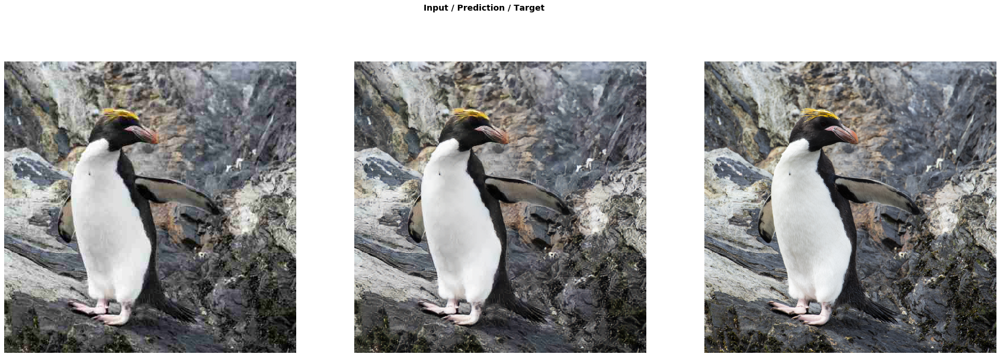

In [13]:
do_fit(learn_gen, 5, gen_name+"_512px_0", slice(1e-3), pct_start=0.5)

epoch,train_loss,valid_loss,ssim_gen,ssim_in,brisque_gen,brisque_in,brisque_tar,niqe_gen,niqe_in,niqe_tar,time
0,0.277256,0.380951,0.664243,0.707517,84.218808,87.354943,85.322157,16.599089,17.860744,15.693551,08:26
1,0.279534,0.275758,0.695189,0.707517,85.417269,87.354943,85.322157,16.793041,17.860744,15.693551,08:42
2,0.285118,0.285619,0.693361,0.707517,85.097904,87.354943,85.322157,16.762035,17.860744,15.693551,08:42


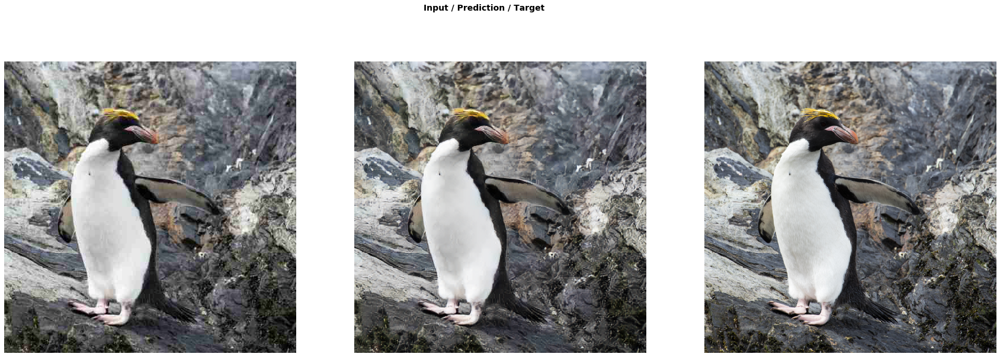

In [14]:
do_fit(learn_gen, 3, gen_name+"_512px_0", slice(1e-4), pct_start=0.5)

In [21]:
learn_gen.unfreeze()

In [19]:
learn_gen.load("/data/students_home/fmameli/repos/Artifact_Removal_GAN/models/unet_superRes_mobilenetV3_LPIPS_Tuned_gen_512px_0")

Learner(data=ImageDataBunch;

Train: LabelList (800 items)
x: ImageImageList
Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512)
y: ImageList
Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512)
Path: dataset/DIV2K_train_LR_512_QF20;

Valid: LabelList (100 items)
x: ImageImageList
Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512)
y: ImageList
Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512)
Path: dataset/DIV2K_train_LR_512_QF20;

Test: None, model=DynamicUnetWide(
  (layers): ModuleList(
    (0): Sequential(
      (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(16, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
      (2): HardSwish()
      (3): Sequential(
        (0): Sequential(
          (0): DepthwiseSeparableConv(
 

epoch,train_loss,valid_loss,ssim_gen,ssim_in,brisque_gen,brisque_in,brisque_tar,niqe_gen,niqe_in,niqe_tar,time
0,0.283525,0.326005,0.683182,0.707517,84.988768,87.354943,85.322157,16.656691,17.860744,15.693551,08:27
1,0.289902,0.338476,0.675912,0.707517,84.113217,87.354943,85.322157,16.696949,17.860744,15.693551,08:24
2,0.284075,0.339259,0.679159,0.707517,84.750133,87.354943,85.322157,16.681017,17.860744,15.693551,08:24


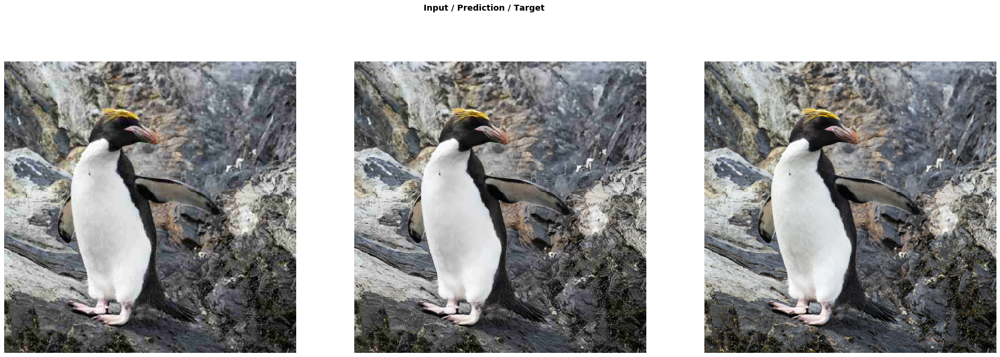

In [22]:
do_fit(learn_gen, 3, gen_name+"_512px_1", slice(1e-4), pct_start=1e-3)

# Validation mobileNetv3

In [29]:
bs=2
sz=512
epochs = 1

path = Path('./dataset/')
path_lowRes_512 = path/'DIV2K_train_LR_512_QF20'

In [30]:
data_gen = get_DIV2k_data_QF(path_lowRes_512, path_fullRes, bs=bs, sz=sz)

In [67]:
learn_gen = gen_learner_wide(data=data_gen,
                             gen_loss=loss_func,
                             arch = model,
                             nf_factor=nf_factor)

In [32]:
learn_gen.metrics.append(SSIM_Metric_gen())
learn_gen.metrics.append(SSIM_Metric_input())
learn_gen.metrics.append(LPIPS_Metric_gen())
learn_gen.metrics.append(LPIPS_Metric_input())
learn_gen.metrics.append(BRISQUE_Metric_gen())
learn_gen.metrics.append(BRISQUE_Metric_input())
learn_gen.metrics.append(BRISQUE_Metric_target())
learn_gen.metrics.append(NIQE_Metric_gen())
learn_gen.metrics.append(NIQE_Metric_input())
learn_gen.metrics.append(NIQE_Metric_target())

Setting up Perceptual loss...
Loading model from: /data/students_home/fmameli/anaconda3/envs/fastai/lib/python3.6/site-packages/perceptual_similarity/weights/v0.1/alex.pth
...[net-lin [alex]] initialized
...Done
Setting up Perceptual loss...
Loading model from: /data/students_home/fmameli/anaconda3/envs/fastai/lib/python3.6/site-packages/perceptual_similarity/weights/v0.1/alex.pth
...[net-lin [alex]] initialized
...Done


In [33]:
learn_gen.load("/data/students_home/fmameli/repos/Artifact_Removal_GAN/models/unet_superRes_mobilenetV3_LPIPS_Tuned_gen_512px_0")

Learner(data=ImageDataBunch;

Train: LabelList (800 items)
x: ImageImageList
Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512)
y: ImageList
Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512)
Path: dataset/DIV2K_train_LR_512_QF20;

Valid: LabelList (100 items)
x: ImageImageList
Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512)
y: ImageList
Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512)
Path: dataset/DIV2K_train_LR_512_QF20;

Test: None, model=DynamicUnetWide(
  (layers): ModuleList(
    (0): Sequential(
      (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(16, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
      (2): HardSwish()
      (3): Sequential(
        (0): Sequential(
          (0): DepthwiseSeparableConv(
 

In [34]:
val = learn_gen.validate()

In [35]:
for name, m in zip(learn_gen.metrics, val[1:]):
    if isinstance(m, torch.Tensor):
        print(name, m.item())
    else:
        print(name, m)

SSIM_Metric_gen 0.6933608651161194
SSIM_Metric_input 0.7075173854827881
LPIPS_Metric_gen 0.1243746355175972
LPIPS_Metric_input 0.1764998435974121
BRISQUE_Metric_gen 85.09790370048958
BRISQUE_Metric_input 87.3549426119021
BRISQUE_Metric_target 85.32215693738695
NIQE_Metric_gen 16.762035
NIQE_Metric_input 17.860744
NIQE_Metric_target 15.693551


# Fine tune MobileNet Small

In [44]:
proj_id = 'unet_wideNf2_superRes_mobilenetSmall_LPIPS_Tuned'

gen_name = proj_id + '_gen'

In [45]:
model = geffnet.mobilenetv3_small_075
loss_func = lpips_loss()

Setting up Perceptual loss...
Loading model from: /data/students_home/fmameli/anaconda3/envs/fastai/lib/python3.6/site-packages/perceptual_similarity/weights/v0.1/alex.pth
...[net-lin [alex]] initialized
...Done


In [46]:
path_lowRes_512 = path/'DIV2K_train_LR_512_QF20'

bs=2
sz=512
lr = 1e-3

data_gen = get_DIV2k_data_QF(path_lowRes_512, path_fullRes, bs=bs, sz=sz)

In [47]:
learn_gen = gen_learner_wide(data=data_gen,
                             gen_loss=loss_func,
                             arch = model,
                             nf_factor=2)

In [48]:
learn_gen.load("/data/students_home/fmameli/repos/Artifact_Removal_GAN/models/unet_wideNf2_superRes_mobilenetSmall_Patches64px_gen_64px_4")

Learner(data=ImageDataBunch;

Train: LabelList (800 items)
x: ImageImageList
Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512)
y: ImageList
Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512)
Path: dataset/DIV2K_train_LR_512_QF20;

Valid: LabelList (100 items)
x: ImageImageList
Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512)
y: ImageList
Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512)
Path: dataset/DIV2K_train_LR_512_QF20;

Test: None, model=DynamicUnetWide(
  (layers): ModuleList(
    (0): Sequential(
      (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): HardSwish()
      (3): Sequential(
        (0): Sequential(
          (0): DepthwiseSeparableConv(
 

In [49]:
learn_gen.metrics.append(SSIM_Metric_gen())
learn_gen.metrics.append(SSIM_Metric_input())
learn_gen.metrics.append(LPIPS_Metric_gen())
learn_gen.metrics.append(LPIPS_Metric_input())
learn_gen.metrics.append(BRISQUE_Metric_gen())
learn_gen.metrics.append(BRISQUE_Metric_input())
learn_gen.metrics.append(BRISQUE_Metric_target())
learn_gen.metrics.append(NIQE_Metric_gen())
learn_gen.metrics.append(NIQE_Metric_input())
learn_gen.metrics.append(NIQE_Metric_target())

Setting up Perceptual loss...
Loading model from: /data/students_home/fmameli/anaconda3/envs/fastai/lib/python3.6/site-packages/perceptual_similarity/weights/v0.1/alex.pth
...[net-lin [alex]] initialized
...Done
Setting up Perceptual loss...
Loading model from: /data/students_home/fmameli/anaconda3/envs/fastai/lib/python3.6/site-packages/perceptual_similarity/weights/v0.1/alex.pth
...[net-lin [alex]] initialized
...Done


In [12]:
# learn_gen.lr_find()
# learn_gen.recorder.plot()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


epoch,train_loss,valid_loss,ssim_gen,ssim_in,lpips_gen,lpips_in,brisque_gen,brisque_in,brisque_tar,niqe_gen,niqe_in,niqe_tar,time
0,0.316139,0.778404,0.492045,0.707517,0.311720,0.176500,81.787003,87.354943,85.322157,15.477719,17.860744,15.693551,08:01
1,0.336366,0.897664,0.526437,0.707517,0.298926,0.176500,83.039891,87.354943,85.322157,15.734357,17.860744,15.693551,08:15
2,0.335758,0.599517,0.545487,0.707517,0.249334,0.176500,74.065368,87.354943,85.322157,15.478869,17.860744,15.693551,08:06
3,0.329149,1.011764,0.487409,0.707517,0.356414,0.176500,78.155960,87.354943,85.322157,15.650810,17.860744,15.693551,07:57
4,0.298921,0.345169,0.662412,0.707517,0.175604,0.176500,85.008705,87.354943,85.322157,15.975472,17.860744,15.693551,07:54


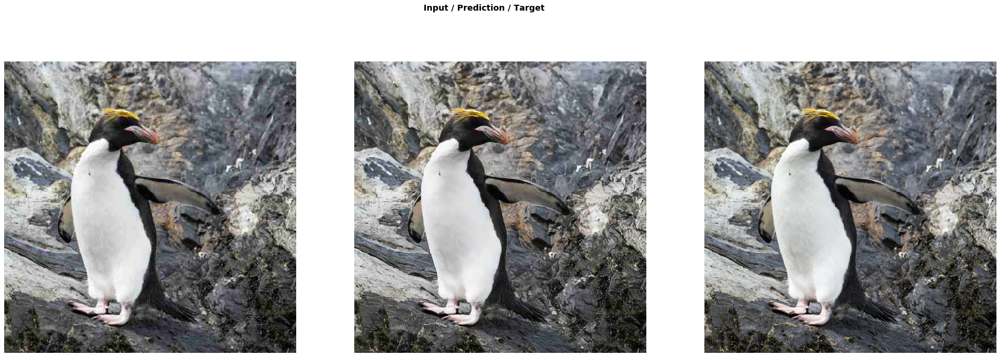

In [51]:
do_fit(learn_gen, 5, gen_name+"_512px_0", slice(1e-2), pct_start=0.8)

epoch,train_loss,valid_loss,ssim_gen,ssim_in,lpips_gen,lpips_in,brisque_gen,brisque_in,brisque_tar,niqe_gen,niqe_in,niqe_tar,time
0,0.289277,0.318964,0.677161,0.707517,0.164198,0.176500,86.170628,87.354943,85.322157,16.275440,17.860744,15.693551,07:52
1,0.288238,0.473463,0.625267,0.707517,0.217742,0.176500,83.710938,87.354943,85.322157,15.587344,17.860744,15.693551,07:44
2,0.303363,0.740375,0.553010,0.707517,0.287279,0.176500,84.194830,87.354943,85.322157,15.170614,17.860744,15.693551,07:37


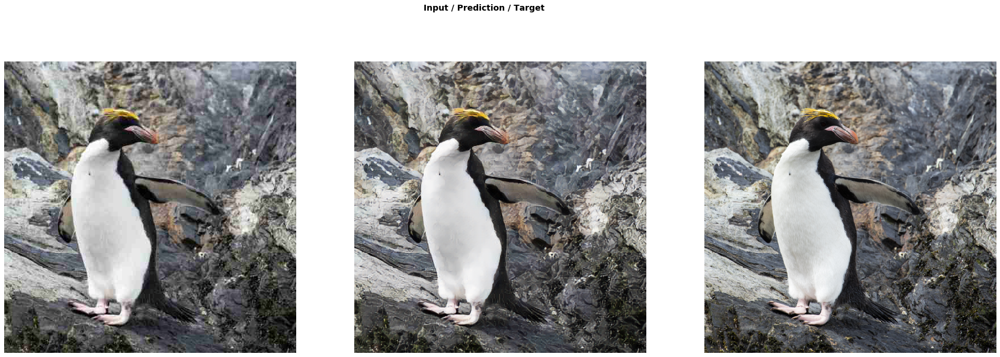

In [52]:
do_fit(learn_gen, 3, gen_name+"_512px_0", slice(1e-3), pct_start=0.5)

epoch,train_loss,valid_loss,ssim_gen,ssim_in,lpips_gen,lpips_in,brisque_gen,brisque_in,brisque_tar,niqe_gen,niqe_in,niqe_tar,time
0,0.291683,0.690102,0.560951,0.707517,0.279942,0.176500,81.985599,87.354943,85.322157,15.110444,17.860744,15.693551,07:31
1,0.296930,0.563859,0.592303,0.707517,0.238294,0.176500,82.775955,87.354943,85.322157,15.497344,17.860744,15.693551,07:41
2,0.295936,0.632054,0.571248,0.707517,0.263871,0.176500,81.091591,87.354943,85.322157,15.354248,17.860744,15.693551,07:44


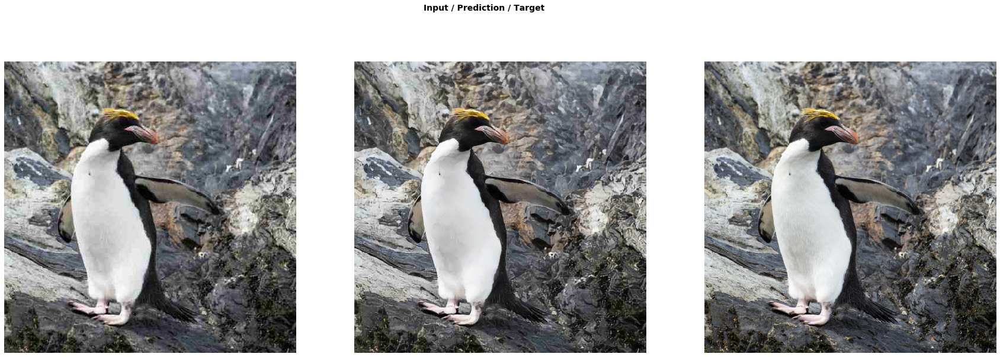

In [53]:
do_fit(learn_gen, 3, gen_name+"_512px_0", slice(1e-4), pct_start=0.3)

In [10]:
learn_gen.unfreeze()

In [ ]:
do_fit(learn_gen, 3, gen_name+"_512px_1", 1e-6, pct_start=1e-8)

# Validation Mobile Small

In [54]:
bs=3
sz=512
epochs = 1

path = Path('./dataset/')
path_lowRes_512 = path/'DIV2K_train_LR_512_QF20'

data_gen = get_DIV2k_data_QF(path_lowRes_512, path_fullRes, bs=bs, sz=sz)

model = geffnet.mobilenetv3_small_075
loss_func = lpips_loss()

learn_gen = gen_learner_wide(data=data_gen,
                             gen_loss=loss_func,
                             arch = model,
                             nf_factor=2)

learn_gen.metrics.append(SSIM_Metric_gen())
learn_gen.metrics.append(SSIM_Metric_input())
learn_gen.metrics.append(LPIPS_Metric_gen())
learn_gen.metrics.append(LPIPS_Metric_input())
learn_gen.metrics.append(BRISQUE_Metric_gen())
learn_gen.metrics.append(BRISQUE_Metric_input())
learn_gen.metrics.append(BRISQUE_Metric_target())
learn_gen.metrics.append(NIQE_Metric_gen())
learn_gen.metrics.append(NIQE_Metric_input())
learn_gen.metrics.append(NIQE_Metric_target())

Setting up Perceptual loss...
Loading model from: /data/students_home/fmameli/anaconda3/envs/fastai/lib/python3.6/site-packages/perceptual_similarity/weights/v0.1/alex.pth
...[net-lin [alex]] initialized
...Done
Setting up Perceptual loss...
Loading model from: /data/students_home/fmameli/anaconda3/envs/fastai/lib/python3.6/site-packages/perceptual_similarity/weights/v0.1/alex.pth
...[net-lin [alex]] initialized
...Done
Setting up Perceptual loss...
Loading model from: /data/students_home/fmameli/anaconda3/envs/fastai/lib/python3.6/site-packages/perceptual_similarity/weights/v0.1/alex.pth
...[net-lin [alex]] initialized
...Done


In [56]:
learn_gen.load("/data/students_home/fmameli/repos/Artifact_Removal_GAN/models/" +  gen_name+"_512px_0")

Learner(data=ImageDataBunch;

Train: LabelList (800 items)
x: ImageImageList
Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512)
y: ImageList
Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512)
Path: dataset/DIV2K_train_LR_512_QF20;

Valid: LabelList (100 items)
x: ImageImageList
Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512)
y: ImageList
Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512)
Path: dataset/DIV2K_train_LR_512_QF20;

Test: None, model=DynamicUnetWide(
  (layers): ModuleList(
    (0): Sequential(
      (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): HardSwish()
      (3): Sequential(
        (0): Sequential(
          (0): DepthwiseSeparableConv(
 

In [57]:
val = learn_gen.validate()

In [58]:
for name, m in zip(learn_gen.metrics, val[1:]):
    if isinstance(m, torch.Tensor):
        print(name, m.item())
    else:
        print(name, m)

SSIM_Metric_gen 0.5680164098739624
SSIM_Metric_input 0.7065438628196716
LPIPS_Metric_gen 0.26465773582458496
LPIPS_Metric_input 0.1753121316432953
BRISQUE_Metric_gen 81.09159108730137
BRISQUE_Metric_input 87.3549426119021
BRISQUE_Metric_target 85.32215693738695
NIQE_Metric_gen 15.354248
NIQE_Metric_input 17.860744
NIQE_Metric_target 15.693551


# Test

In [59]:
bs=1
sz=512
epochs = 1

In [60]:
path_lowRes_512 = path/'DIV2K_train_LR_512_QF20'
size=( 512, 680)

In [68]:
data_1k = (ImageImageList.from_folder(path_lowRes_512, presort=True).split_by_idxs(
            train_idx=list(range(0, 800)), valid_idx=list(range(800, 900)))
          .label_from_func(lambda x: path_fullRes/x.name.replace(".jpg", ".png"))
          .transform(get_transforms(), size=size, tfm_y=True)
          .databunch(bs=1).normalize(imagenet_stats, do_y=True))
data_1k.c = 3

In [78]:
learn_gen.data = data_1k
learn_gen.freeze()
gc.collect()

140

In [77]:
weights = "/data/students_home/fmameli/repos/Artifact_Removal_GAN/models/unet_superRes_mobilenetV3_LPIPS_Tuned_gen_512px_0"
learn_gen.load(weights, with_opt=False)

Learner(data=ImageDataBunch;

Train: LabelList (800 items)
x: ImageImageList
Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512)
y: ImageList
Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512)
Path: dataset/DIV2K_train_LR_512_QF20;

Valid: LabelList (100 items)
x: ImageImageList
Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512)
y: ImageList
Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512)
Path: dataset/DIV2K_train_LR_512_QF20;

Test: None, model=DynamicUnetWide(
  (layers): ModuleList(
    (0): Sequential(
      (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(16, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
      (2): HardSwish()
      (3): Sequential(
        (0): Sequential(
          (0): DepthwiseSeparableConv(
 

In [63]:
fn = data_1k.valid_dl.x.items[2]; fn

PosixPath('dataset/DIV2K_train_LR_512_QF20/0803.jpg')

In [79]:
img = open_image(fn); print(img.shape)
p,img_hr,b = learn_gen.predict(img)

torch.Size([3, 512, 680])


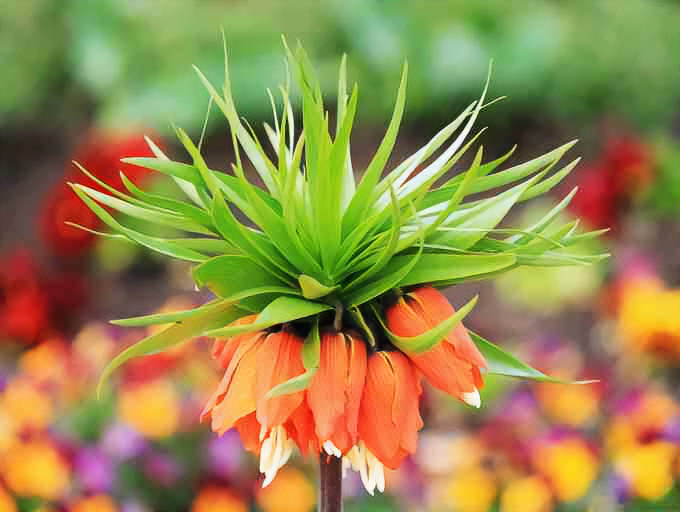

In [80]:
p

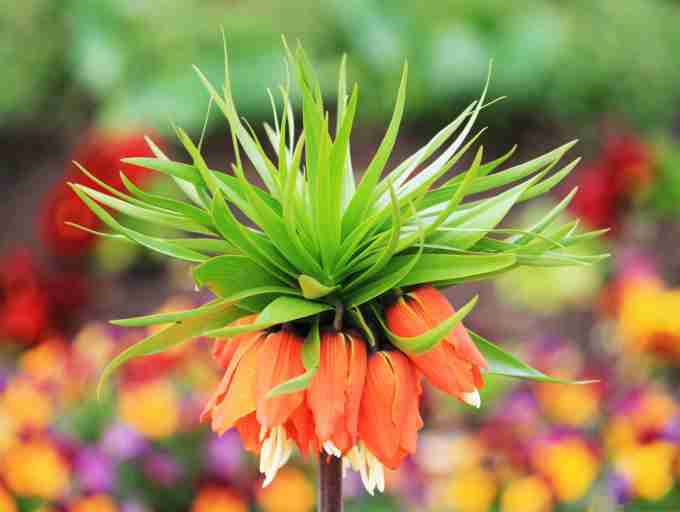

In [43]:
img

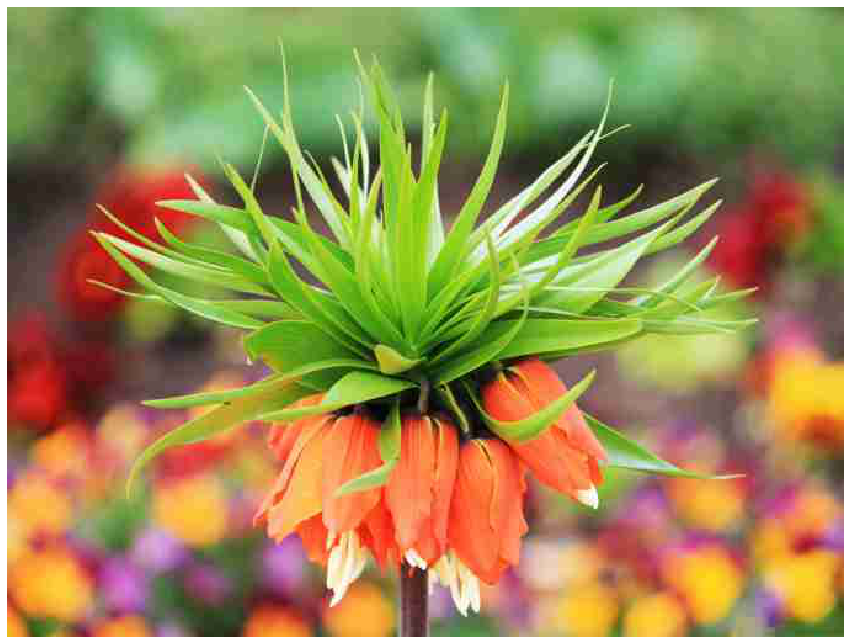

In [17]:
show_image(img, figsize=(15,15), interpolation='nearest');

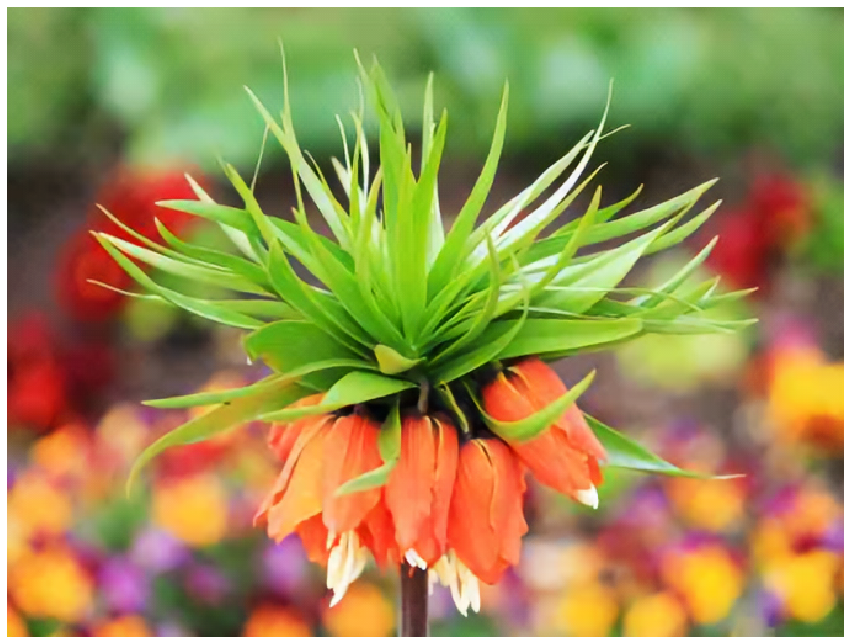

In [19]:
show_image(p, figsize=(15,15), interpolation='nearest');